In [1]:
import pandas as pd
article_df = pd.read_csv('/Users/amalkurian/Desktop/Dissertation/Bias Detection/diffbot-export-tigray-war.csv')
article_df.columns

Index(['title', 'date_str', 'author', 'icon', 'siteName', 'tags_label', 'text',
       'sentiment', 'pageUrl', 'quotes_quote'],
      dtype='object')

In [21]:
article_df.head(3)

,title,date_str,author,icon,siteName,tags_label,text,sentiment,pageUrl,quotes_quote,topic_name,text_length,text_len
0,Ethiopia's Tigray forces say Eritreans widen w...,d2022-10-10T16:29,Associated Press,https://s.abcnews.com/assets/dtci/images/favic...,ABC News,"Ethiopia,Tigray Region,Eritrea,African Union,A...",Ethiopia’s Tigray rebels say Eritrea has exten...,-0.187,https://abcnews.go.com/International/wireStory...,But any provocations will be met with the nece...,Other,493,493
1,Ethiopia's Tigray conflict: Civilian bloodbath...,d2022-10-16T17:00,NaN,https://static.files.bbci.co.uk/core/website/a...,BBC News,"Tigray Region,Tedros Adhanom Ghebreyesus,Ethiopia",AFP\nThe civil war that began in November 2020...,-0.689,https://www.bbc.co.uk/news/world-africa-63275598,NaN,Other,642,642
2,Eritreans hunted down as military call-up inte...,d2022-10-12T08:00,NaN,https://static.files.bbci.co.uk/core/website/a...,BBC News,"Tigray Region,Abiy Ahmed Ali,Eritrea,Ethiopia,...",Getty Images\nEritrea has been criticised for ...,-0.610,https://www.bbc.com/news/world-africa-63208353,NaN,Other,1204,1204


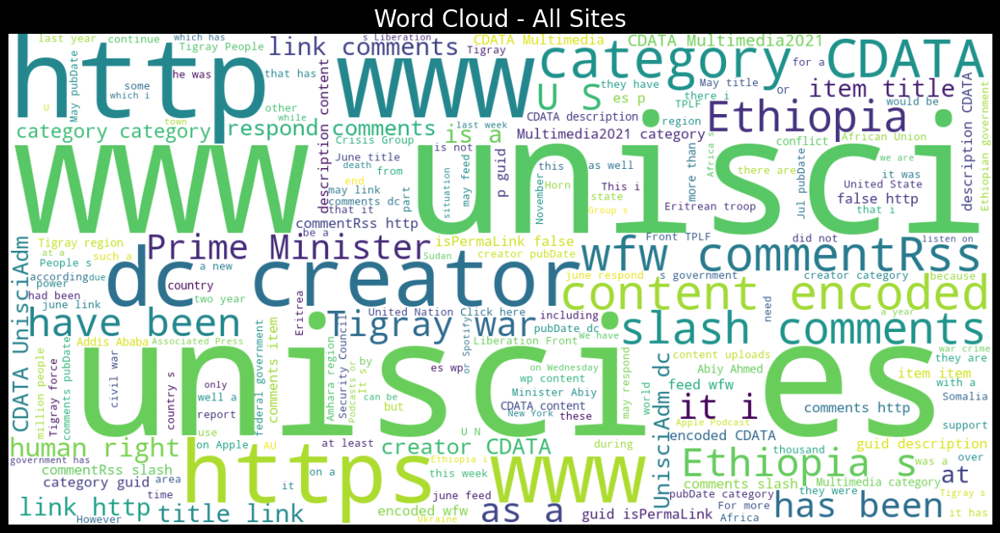

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud
article_df["text"] = article_df["text"].astype(str)

all_text = " ".join(article_df["text"].dropna())

wordcloud = WordCloud(width=1200, height=600, 
                      background_color="white",
                      stopwords={"said", "will", "one", "in", "the", "and", "to", "of", ".org"}  # add custom stopwords if needed
                     ).generate(all_text)

plt.figure(figsize=(15,8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word Cloud - All Sites", fontsize=20)
plt.show()



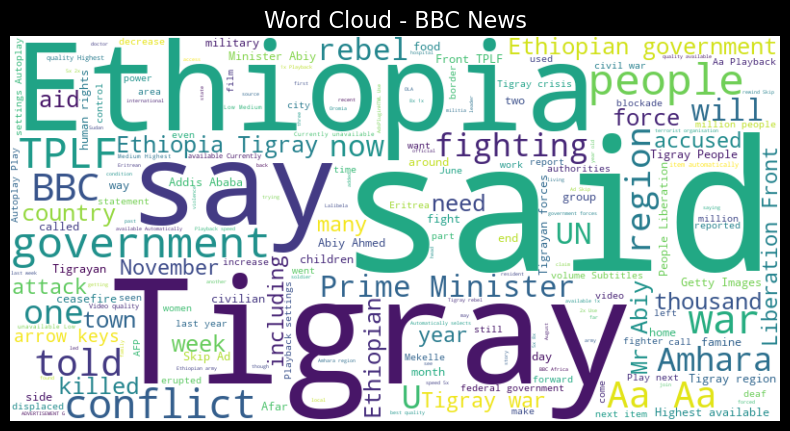

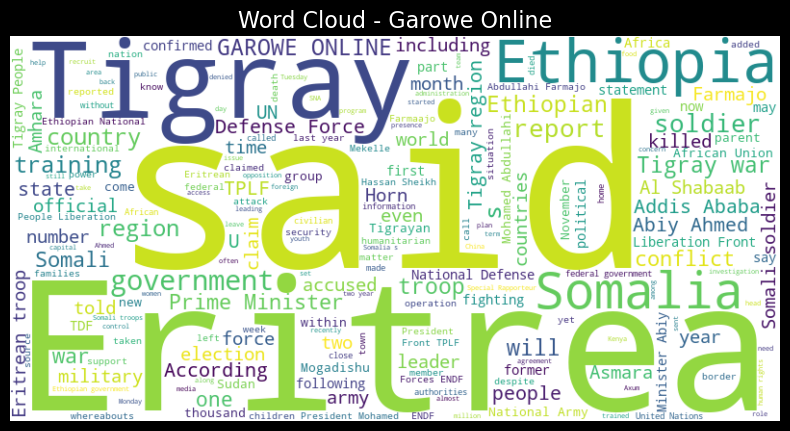

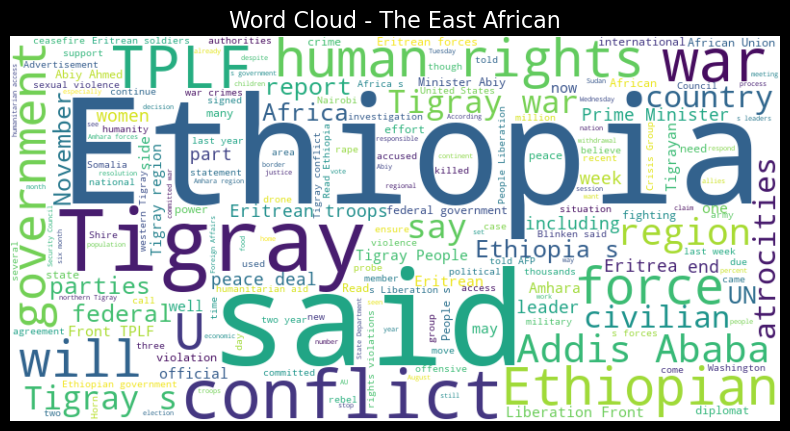

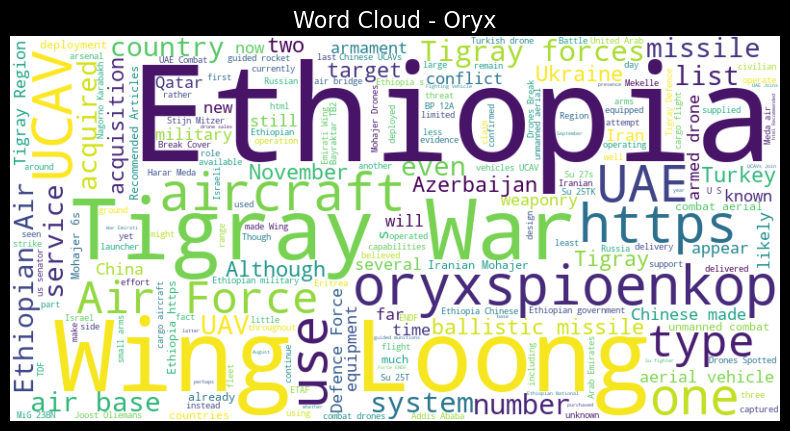

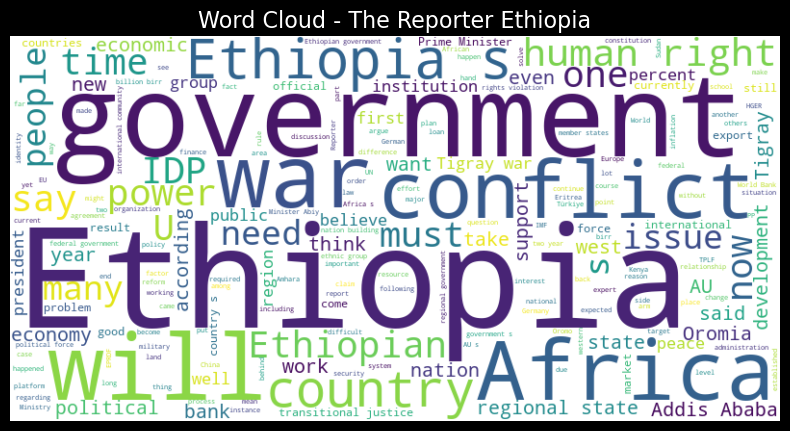

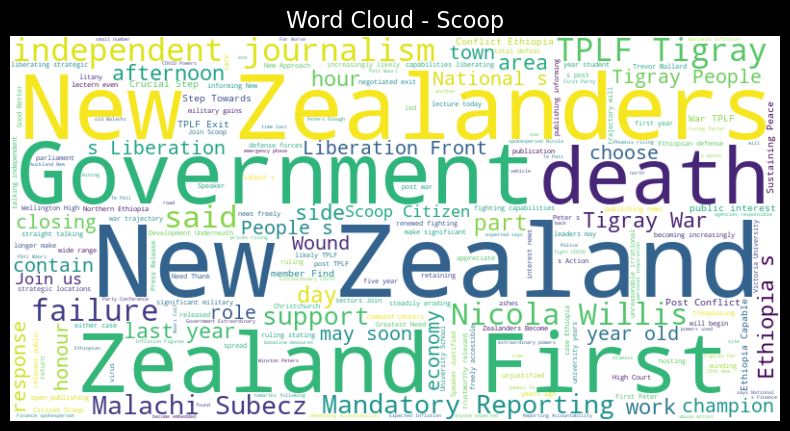

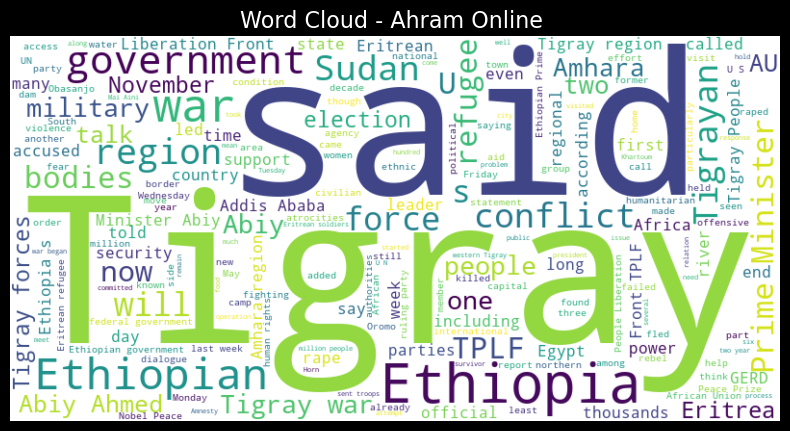

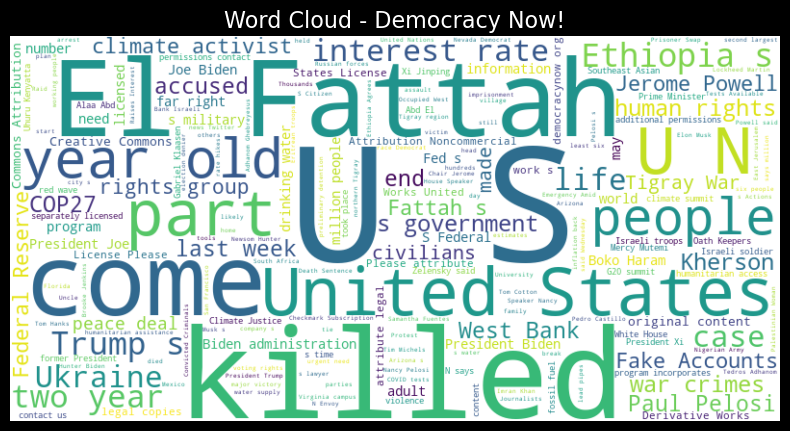

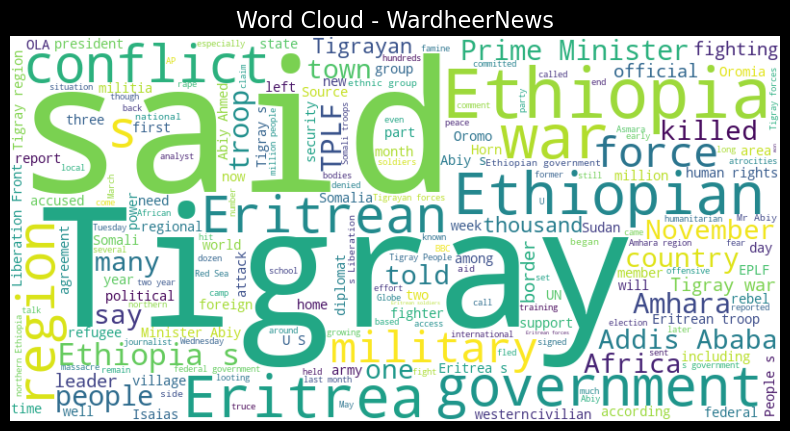

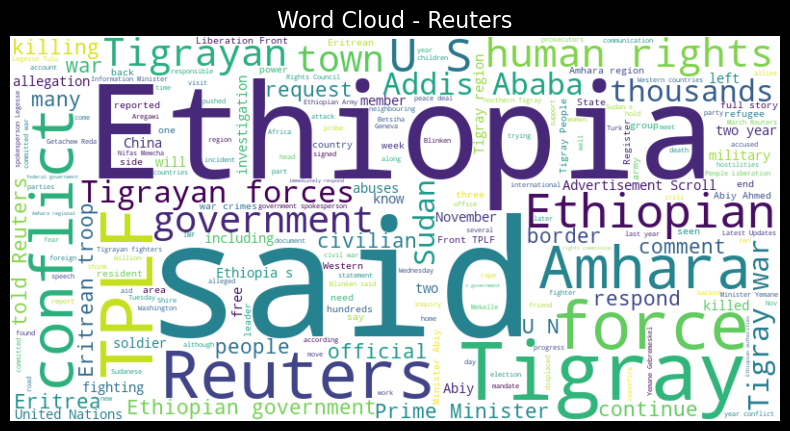

In [4]:
# Top 10 sites by article count
top_sites = article_df["siteName"].value_counts().head(10).index

for site in top_sites:
    site_text = " ".join(article_df[article_df["siteName"] == site]["text"].dropna())
    if site_text.strip():
        wordcloud = WordCloud(width=800, height=400, background_color="white").generate(site_text)
        
        plt.figure(figsize=(10,5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Word Cloud - {site}", fontsize=16)
        plt.show()


In [5]:
article_df["siteName"].value_counts().head(30).index

Index(['BBC News', 'Garowe Online', 'The East African', 'Oryx',
       'The Reporter Ethiopia', 'Scoop', 'Ahram Online ', 'Democracy Now!',
       'WardheerNews', 'Reuters', 'AP NEWS', 'Dehai', 'Modern Ghana',
       'hiiraan.com', 'Catholic World News', 'The Citizen',
       'The Africa Report.com', 'Al Jazeera', 'VOA', 'Eurasia Review',
       'DW.COM', 'wbal.com', 'warnewsupdates.blogspot.com', 'Crisis Group',
       'thestar.com', 'Hosted', 'The Globe and Mail',
       'International Business Times', 'Zawya.com', 'News24'],
      dtype='object', name='siteName')

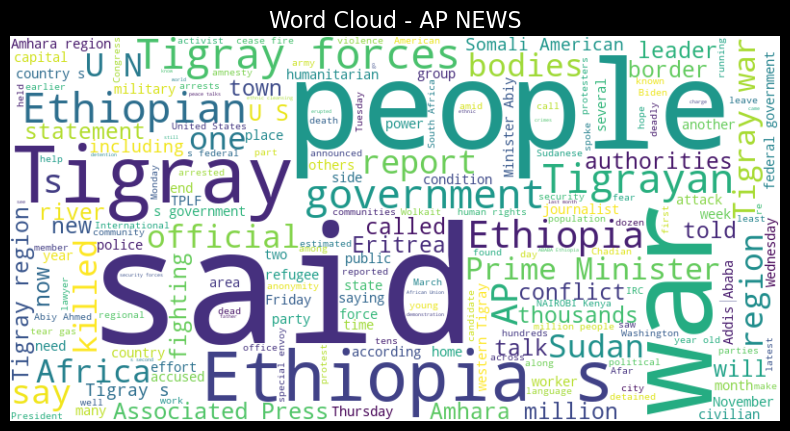

In [6]:
# Top 10 sites by article count
top_sites = article_df["siteName"].value_counts().head(1).index

for site in top_sites:
    site_text = " ".join(article_df[article_df["siteName"] == 'AP NEWS']["text"].dropna())
    if site_text.strip():
        wordcloud = WordCloud(width=800, height=400, background_color="white").generate(site_text)
        
        plt.figure(figsize=(10,5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Word Cloud - {'AP NEWS'}", fontsize=16)
        plt.show()


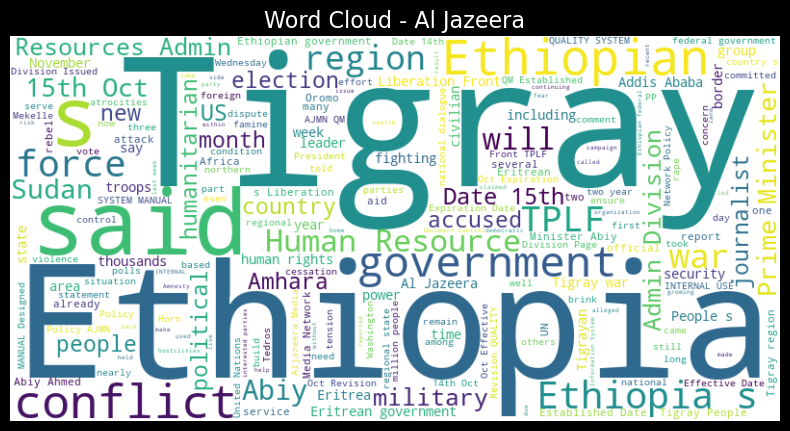

In [7]:
# Top 10 sites by article count
top_sites = article_df["siteName"].value_counts().head(1).index

for site in top_sites:
    site_text = " ".join(article_df[article_df["siteName"] == 'Al Jazeera']["text"].dropna())
    if site_text.strip():
        wordcloud = WordCloud(width=800, height=400, background_color="white").generate(site_text)
        
        plt.figure(figsize=(10,5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Word Cloud - {'Al Jazeera'}", fontsize=16)
        plt.show()


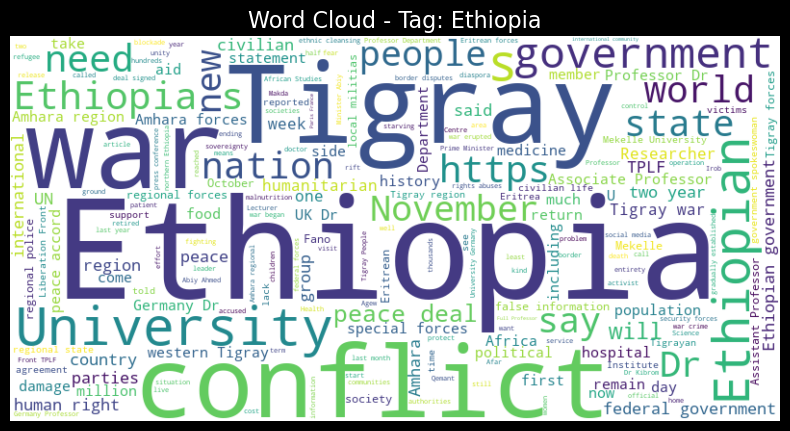

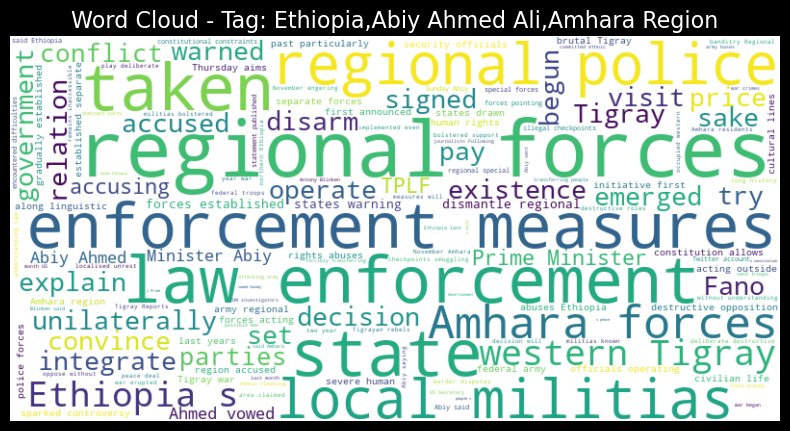

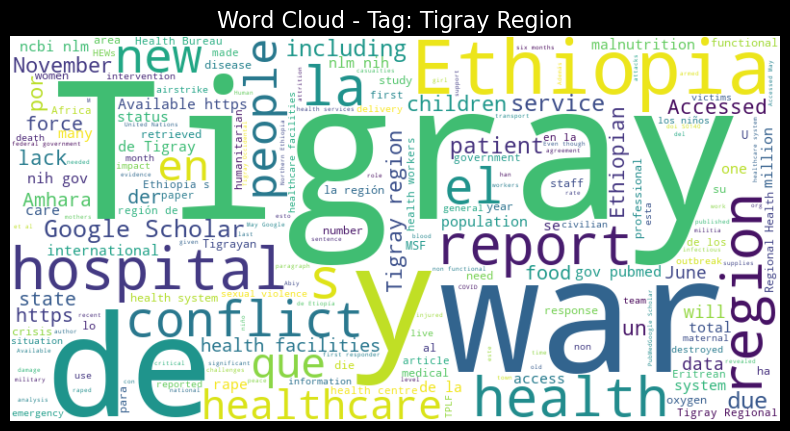

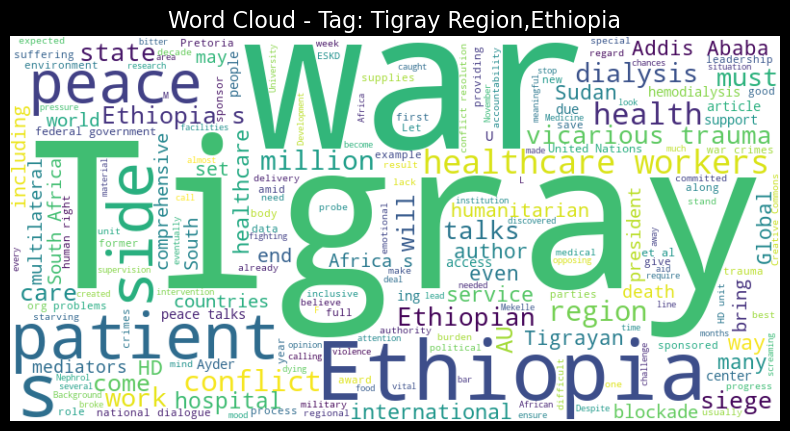

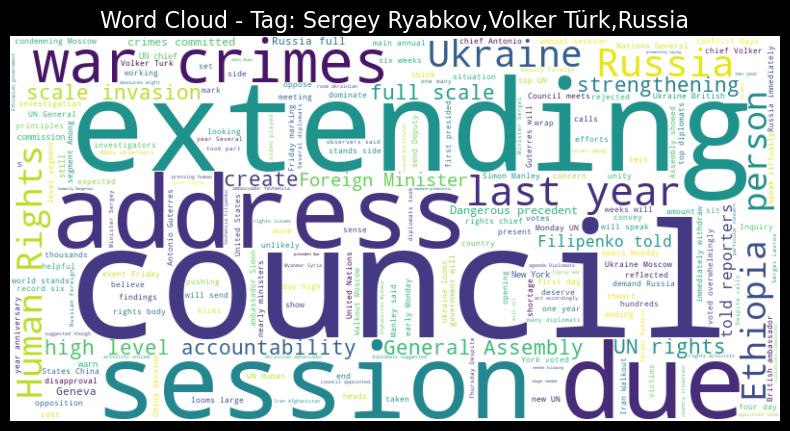

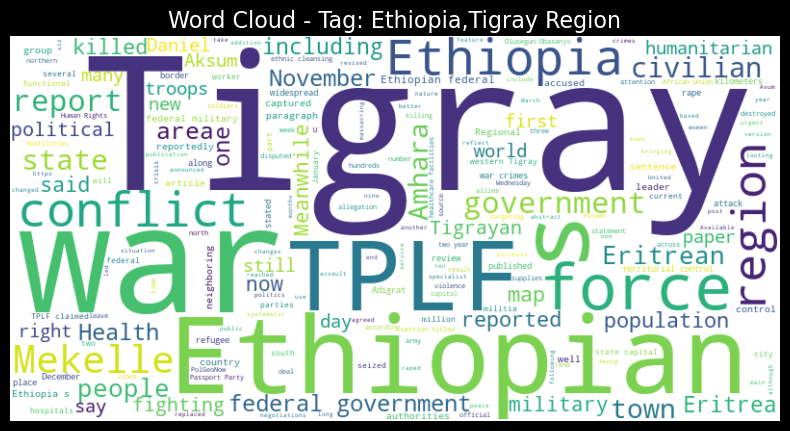

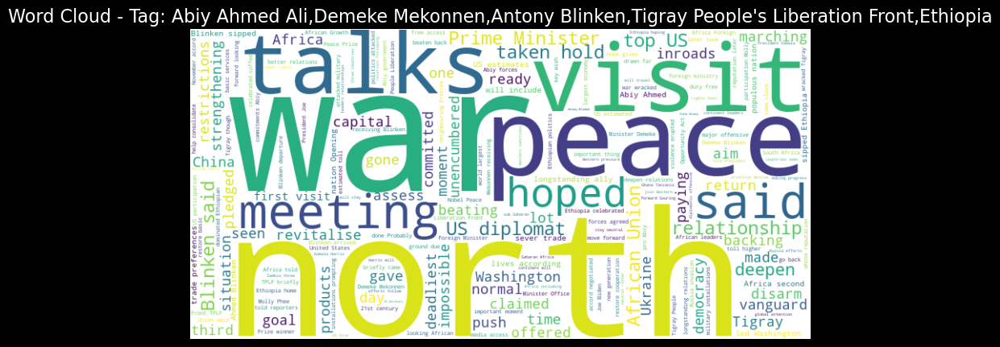

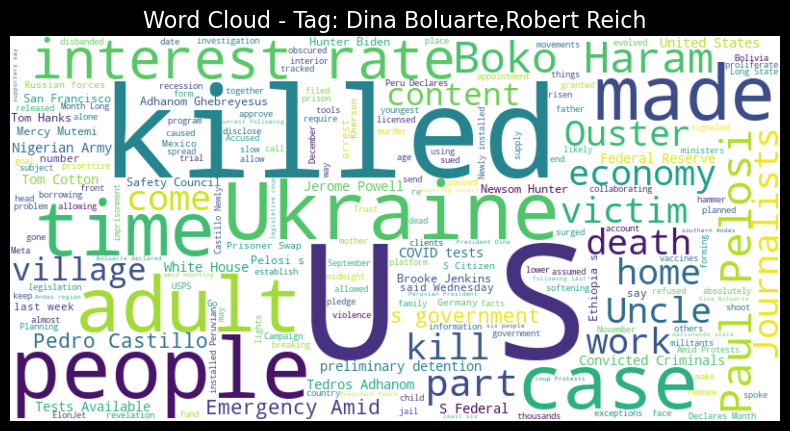

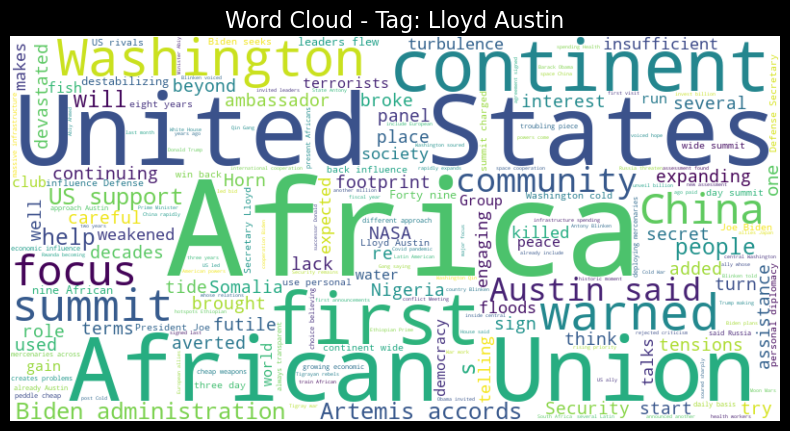

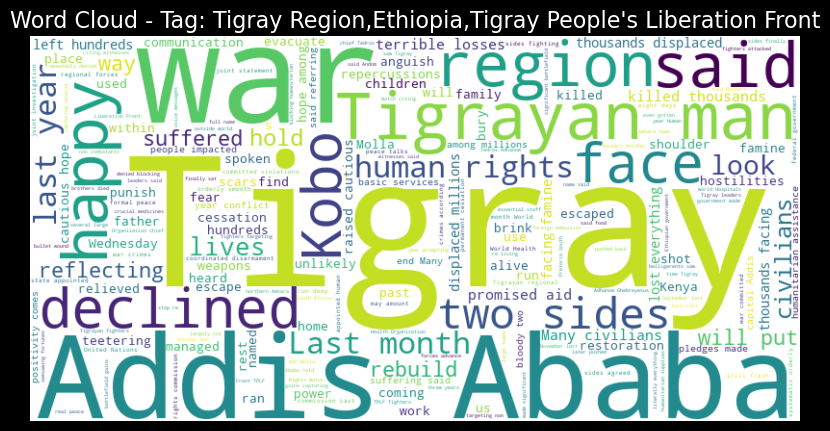

In [8]:
top_tags = article_df["tags_label"].value_counts().head(10).index

for tag in top_tags:
    tag_text = " ".join(article_df[article_df["tags_label"] == tag]["text"].dropna())
    if tag_text.strip():
        wordcloud = WordCloud(width=800, height=400, background_color="white").generate(tag_text)
        
        plt.figure(figsize=(10,5))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"Word Cloud - Tag: {tag}", fontsize=16)
        plt.show()


In [9]:

!pip install langdetect

from langdetect import detect

def is_english(text):
    try:
        return detect(text) == 'en'
    except:
        return False

texts = article_df['text'].dropna().astype(str)
texts = texts[texts.apply(is_english)].tolist()

In [10]:
import re

def clean_text(text):
    text = text.lower()                          # lowercase
    text = re.sub(r'http\S+', '', text)         # remove URLs
    text = re.sub(r'[^a-z\s]', '', text)        # remove punctuation/numbers
    text = re.sub(r'\s+', ' ', text)            # remove extra whitespace
    return text.strip()

texts = article_df['text'].dropna().astype(str).apply(clean_text).tolist()


In [12]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer

custom_stopwords = ["the", "in", "of", "to", "and", "for", "on", "with", "a", "der", "die", "das", "und", "von", "den", "zu", 
                    "mit", "auf", "is", "at", "it", "this", "that", "der", "die", "das", "und", "von", "den", "zu", "mit", "auf", 
                    "ist", "sie", "es", "sich", "als", "eine", "im", "nicht", "auch", "des"
                        ]  # extend as needed

vectorizer_model = CountVectorizer(stop_words=custom_stopwords)

topic_model = BERTopic(vectorizer_model=vectorizer_model, language="english")
topics, probs = topic_model.fit_transform(texts)
topic_model.get_topic_info()
topic_model.visualize_topics()
topic_model.visualize_barchart()


KeyboardInterrupt: 

In [13]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import text
import pandas as pd

# ------------------------------
# Your data
# ------------------------------
# texts = [...]  # list of documents
# article_df = pd.DataFrame({'text': texts})

# ------------------------------
# Stopwords (English + German)
# ------------------------------
custom_stopwords = list(text.ENGLISH_STOP_WORDS.union([
    "der","die","das","und","von","den","zu","mit","auf",
    "ist","sie","es","sich","als","eine","im","nicht","auch","des"
]))

# ------------------------------
# Initialize BERTopic
# ------------------------------
vectorizer_model = CountVectorizer(stop_words=custom_stopwords)
topic_model = BERTopic(vectorizer_model=vectorizer_model, language="english")

# ------------------------------
# Fit the model
# ------------------------------
topics, probs = topic_model.fit_transform(texts)

# ------------------------------
# Manually assign human-readable labels
# ------------------------------
# If a topic is noise (like German stopwords), mark as "Other"
topic_labels = {
    1: "New Zealand News",
    2: "Humanitarian Aid – Tigray",
    3: "New Zealand News (duplicate cluster)",
    4: "Somalia/Eritrea Military",
    5: "Eritrean Politics & Independence",
    6: "Other",  # noise topic
    7: "Human Rights & Governance"
}

# ------------------------------
# Map topic numbers to labels
# ------------------------------
article_df['topic_name'] = [topic_labels[t] if t in topic_labels else "Other" for t in topics]

# ------------------------------
# Optional: Inspect topic distribution
# ------------------------------
print(article_df['topic_name'].value_counts())

# ------------------------------
# Visualizations
# ------------------------------
topic_model.visualize_topics()
topic_model.visualize_barchart()


topic_name
Other                                   2235
New Zealand News                          53
Humanitarian Aid – Tigray                 49
New Zealand News (duplicate cluster)      49
Somalia/Eritrea Military                  44
Eritrean Politics & Independence          42
Human Rights & Governance                 38
Name: count, dtype: int64


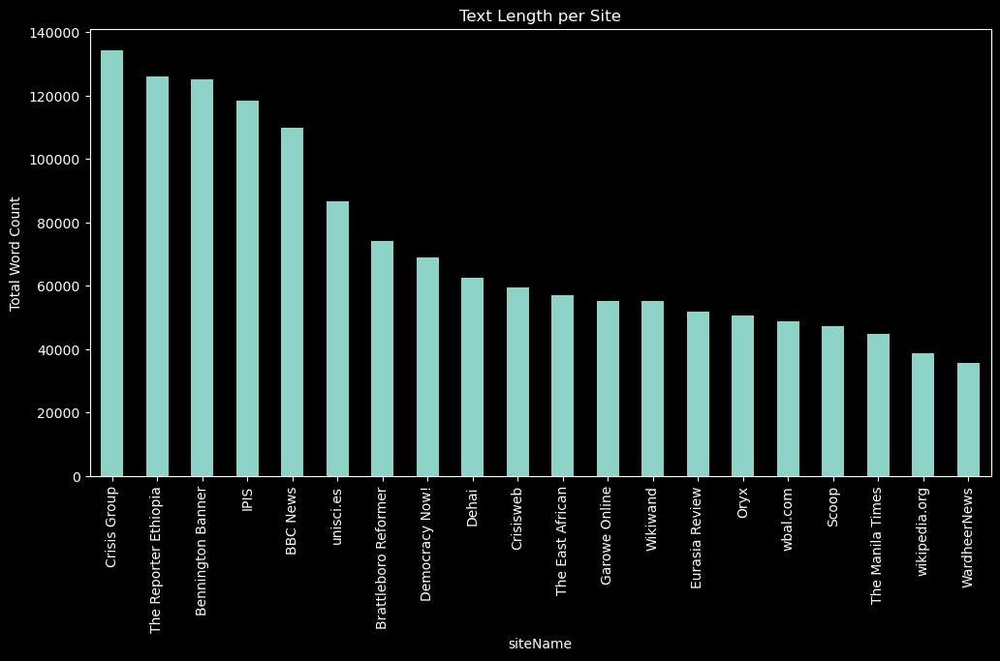

In [14]:
import pandas as pd
import matplotlib.pyplot as plt

# Example: your dataframe has columns 'siteName' and 'text'
article_df['text_length'] = article_df['text'].str.split().apply(len)

# Aggregate average or total length per site
text_len_per_site = article_df.groupby('siteName')['text_length'].sum().sort_values(ascending=False).head(20)

# Plot
plt.figure(figsize=(12,6))
text_len_per_site.plot(kind='bar')
plt.ylabel('Total Word Count')
plt.title('Text Length per Site')
plt.show()


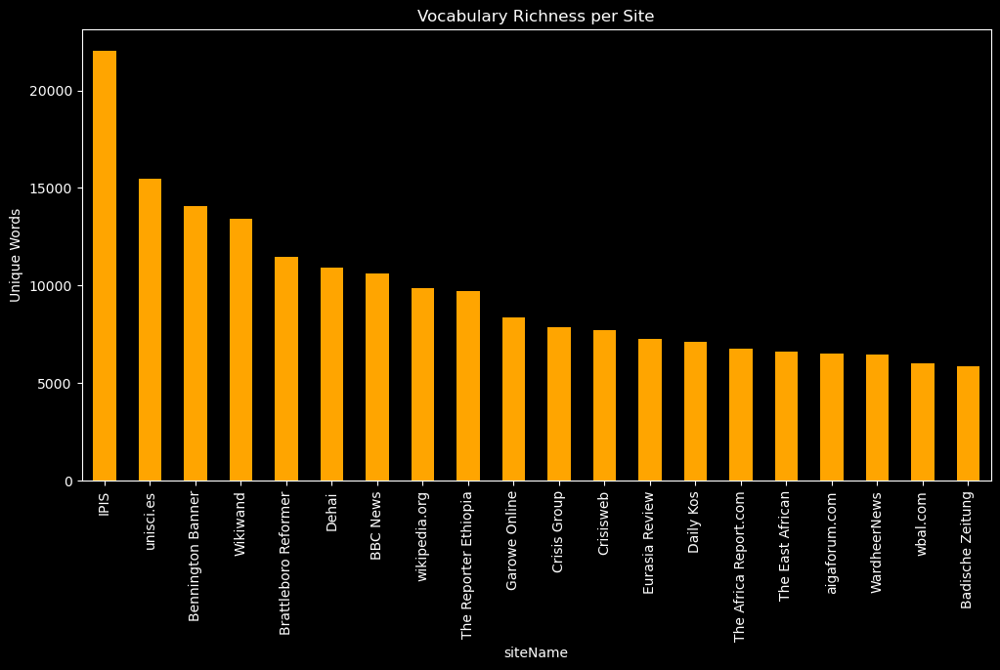

In [15]:
from collections import Counter

def unique_words(text_series):
    words = " ".join(text_series).split()
    return len(set(words))

vocab_per_site = article_df.groupby('siteName')['text'].apply(unique_words).sort_values(ascending=False).head(20)

# Plot
plt.figure(figsize=(12,6))
vocab_per_site.plot(kind='bar', color='orange')
plt.ylabel('Unique Words')
plt.title('Vocabulary Richness per Site')
plt.show()


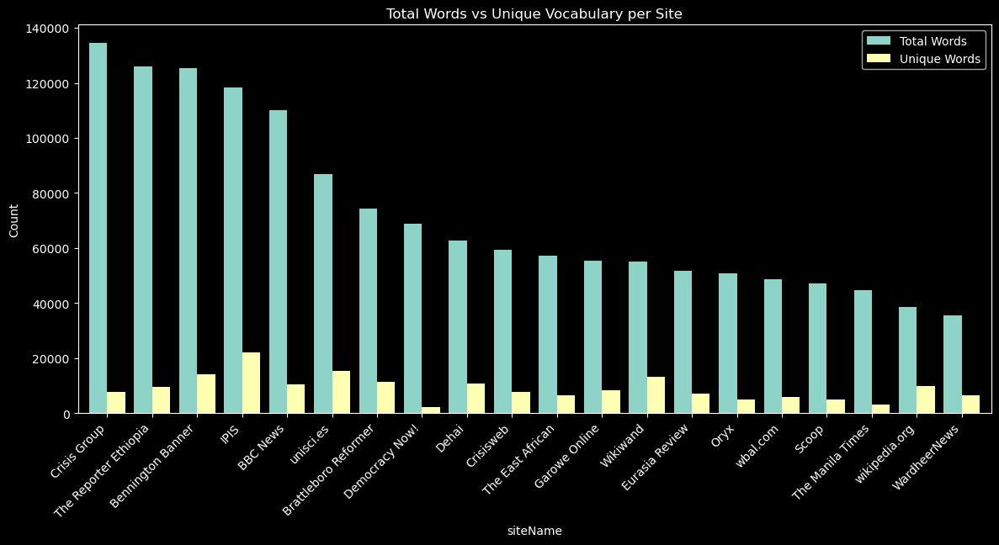

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Total words per site
text_len_per_site = article_df.groupby('siteName')['text_length'].sum()

# Unique vocab per site
def unique_words(text_series):
    words = " ".join(text_series).split()
    return len(set(words))

vocab_per_site = article_df.groupby('siteName')['text'].apply(unique_words)

# Combine into one DataFrame
combined = pd.DataFrame({
    'Total_Words': text_len_per_site,
    'Unique_Words': vocab_per_site
}).sort_values('Total_Words', ascending=False).head(20)

# Plot
combined.plot(kind='bar', figsize=(14,6), width=0.8)
plt.ylabel("Count")
plt.title("Total Words vs Unique Vocabulary per Site")
plt.xticks(rotation=45, ha='right')
plt.legend(["Total Words", "Unique Words"])
plt.show()


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


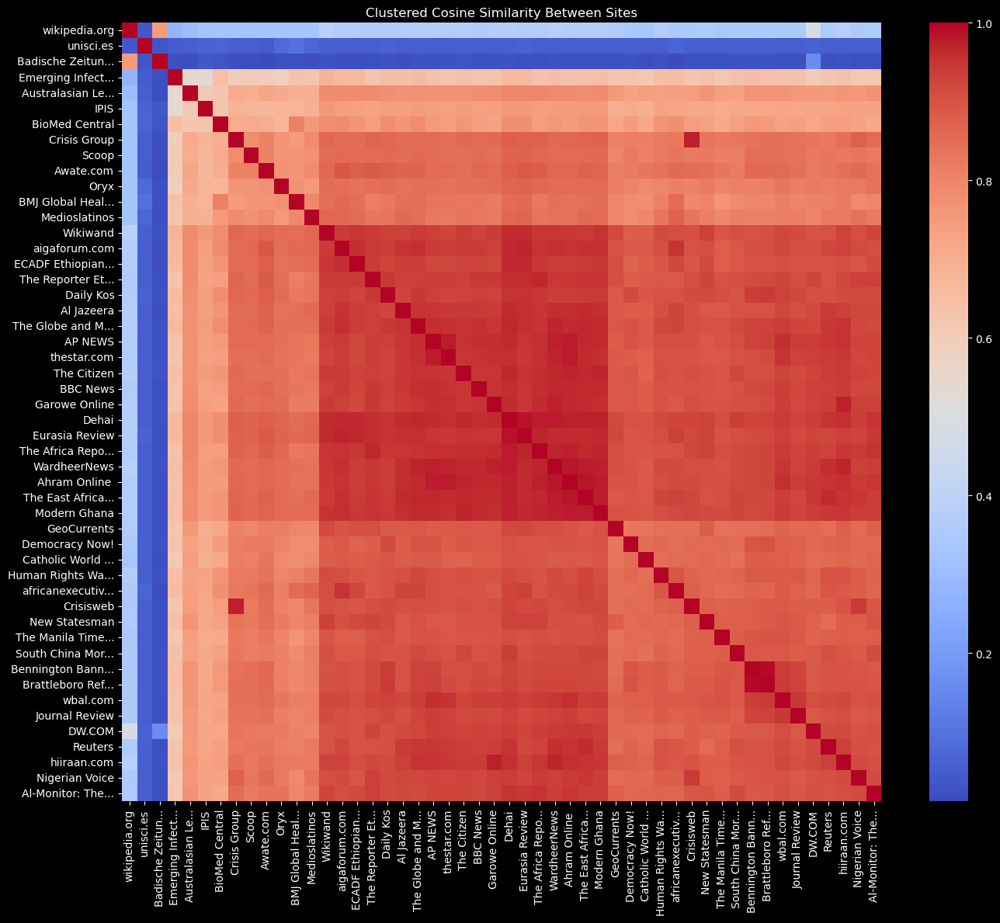

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import scipy.cluster.hierarchy as sch


site_texts = article_df.groupby('siteName')['text'].apply(lambda x: " ".join(x))

# Optional: pick top 50 sites if too many
top_sites = site_texts.str.len().sort_values(ascending=False).head(50).index
site_texts = site_texts.loc[top_sites]


vectorizer = TfidfVectorizer(max_features=6000)
tfidf_matrix = vectorizer.fit_transform(site_texts)
cos_sim = cosine_similarity(tfidf_matrix)


linkage = sch.linkage(cos_sim, method='ward')
dendro = sch.dendrogram(linkage, labels=site_texts.index, no_plot=True)
ordered_idx = dendro['leaves']
cos_sim_ordered = cos_sim[ordered_idx][:, ordered_idx]

short_labels = {name: (name[:15] + '...') if len(name) > 15 else name for name in site_texts.index}


plt.figure(figsize=(14,12))
sns.heatmap(
    cos_sim_ordered,
    xticklabels=[short_labels[site_texts.index[i]] for i in ordered_idx],
    yticklabels=[short_labels[site_texts.index[i]] for i in ordered_idx],
    cmap='coolwarm',
    annot=False
)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title('Clustered Cosine Similarity Between Sites')
plt.tight_layout()
plt.show()


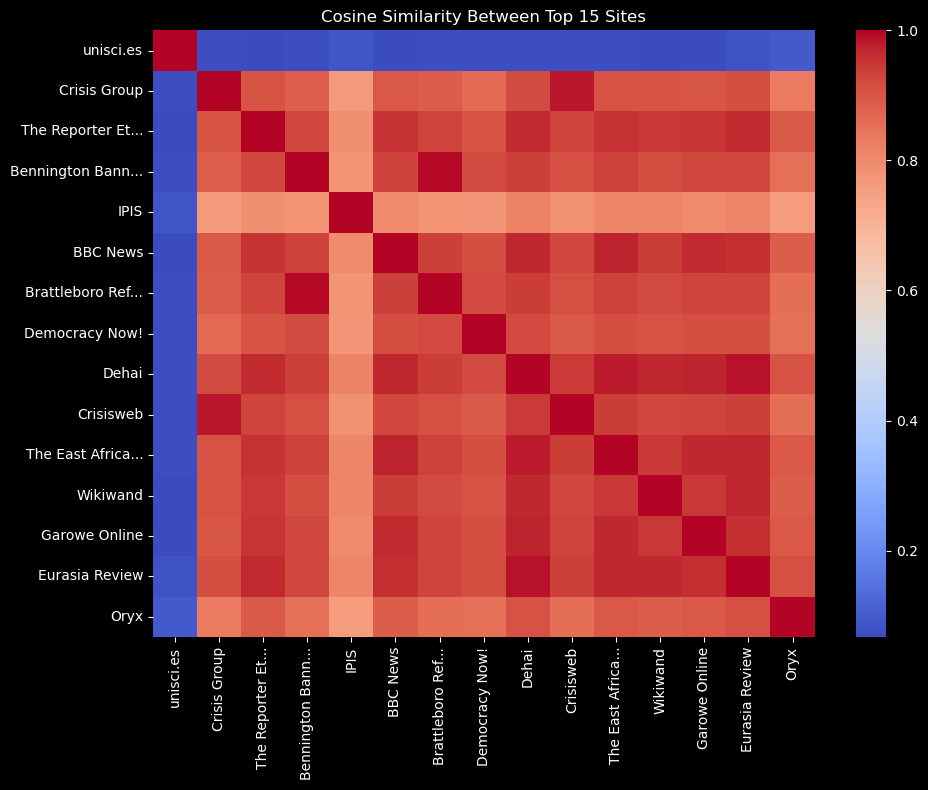

In [18]:
# Pick top 15 sites
top_n = 15
top_sites = site_texts.str.len().sort_values(ascending=False).head(top_n).index
tfidf_matrix_top = vectorizer.fit_transform(site_texts.loc[top_sites])
cos_sim_top = cosine_similarity(tfidf_matrix_top)

# Shorten labels
short_labels_top = {name: (name[:15] + '...') if len(name) > 15 else name for name in top_sites}

plt.figure(figsize=(10,8))
sns.heatmap(
    cos_sim_top,
    xticklabels=[short_labels_top[s] for s in top_sites],
    yticklabels=[short_labels_top[s] for s in top_sites],
    cmap='coolwarm',
    annot=False
)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title('Cosine Similarity Between Top 15 Sites')
plt.tight_layout()
plt.show()


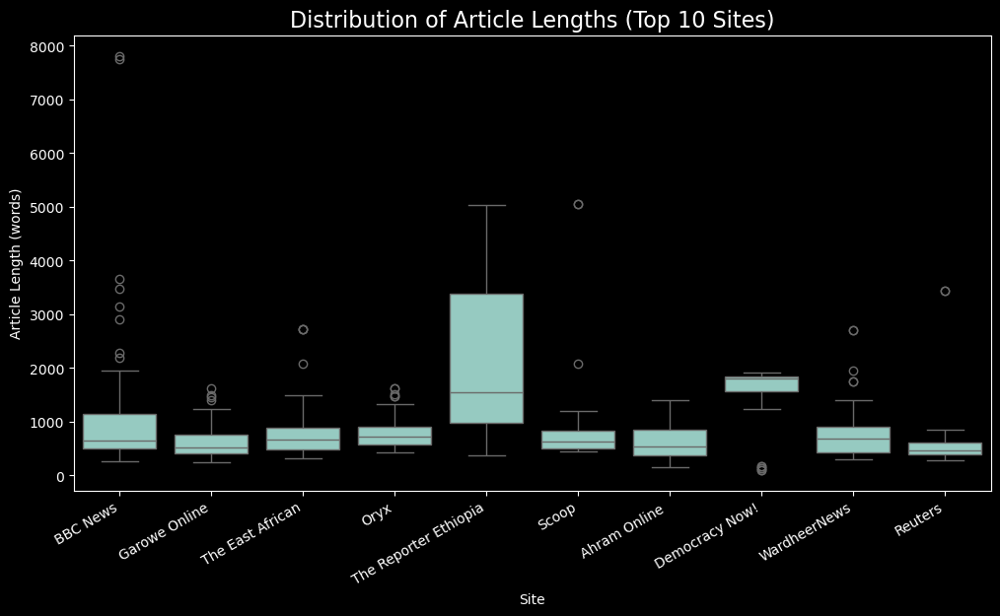

In [19]:
import seaborn as sns

# Add length column
article_df["text_len"] = article_df["text"].str.split().str.len()

top_sites = article_df["siteName"].value_counts().head(10).index
filtered_df = article_df[article_df["siteName"].isin(top_sites)]

plt.figure(figsize=(12,6))
sns.boxplot(x="siteName", y="text_len", data=filtered_df, order=top_sites)
plt.xticks(rotation=30, ha="right")
plt.xlabel("Site")
plt.ylabel("Article Length (words)")
plt.title("Distribution of Article Lengths (Top 10 Sites)", fontsize=16)
plt.show()



In [20]:
df1 = pd.read_csv("/Users/amalkurian/Desktop/Dissertation/Bias Detection/Deliverables/article_event_matches_mergedII.csv")
df2 = pd.read_csv("/Users/amalkurian/Desktop/Dissertation/Bias Detection/Deliverables/events02_df.csv")


FileNotFoundError: [Errno 2] No such file or directory: '/Users/amalkurian/Desktop/Dissertation/Bias Detection/Deliverables/events02_df.csv'

In [ ]:
# If entities are lists, explode them first
df1_exploded = df1.explode('entities_Group')
df2_exploded = df2.explode('entities_Group')

# Get unique entities per dataset
entities_a = set(df1_exploded['entities_Group'].dropna().unique())
entities_b = set(df2_exploded['entities_Group'].dropna().unique())


In [ ]:
!pip install matplotlib-venn


/opt/anaconda3/lib/python3.12/pty.py:95: DeprecationWarning:

This process (pid=49390) is multi-threaded, use of forkpty() may lead to deadlocks in the child.

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for matplotlib-venn: filename=matplotlib_venn-1.1.2-py3-none-any.whl size=45388 sha256=f480bcafcabcb9cf3a98da24ef8ed5d07bce6fc6c7c70561d3c509ae31c39013
  Stored in directory: /Users/amalkurian/Library/Caches/pip/wheels/c2/47/0c/f014c55a1cfd56dce41a1cafd23e3c590652b5e71330cc181c
Successfully built matplotlib-venn


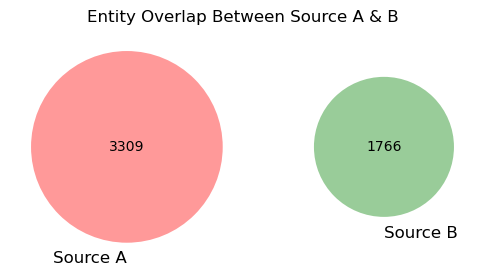

In [ ]:
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
venn2([entities_a, entities_b], set_labels=('Source A', 'Source B'))
plt.title("Entity Overlap Between Source A & B")
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Count occurrences per entity in each source
top_a = df1_exploded['entities_Group'].value_counts().head(20)
top_b = df2_exploded['entities_Group'].value_counts().head(20)

# Merge top entities from both sources
top_entities = list(set(top_a.index).union(set(top_b.index)))

# Reindex counts to include all top_entities
counts_df = pd.DataFrame({
    'Source A': top_a.reindex(top_entities, fill_value=0),
    'Source B': top_b.reindex(top_entities, fill_value=0)
})

# Reset index and rename column to Entity
counts_reset = counts_df.reset_index().rename(columns={'index': 'Entity'})

# Melt into long format for seaborn
counts_melted = counts_reset.melt(
    id_vars="Entity",
    var_name="Source",
    value_name="Count"
)

# ---- Plot ----
plt.figure(figsize=(12, 6))
sns.barplot(data=counts_melted, x="Entity", y="Count", hue="Source")
plt.xticks(rotation=45, ha="right")
plt.title("Entity Frequency by Source")
plt.tight_layout()
plt.show()
